In [2]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from tqdm import tqdm
import hdbscan
import matplotlib.pyplot as plt
import umap.plot
import urllib

/Users/yueqih/github-classroom/StoryLens/StoryLens/venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/yueqih/github-classroom/StoryLens/StoryLens/venv/lib/python3.13/site-packages/numba/np/ufunc/dufunc.py:344: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/Users/yueqih/github-classroom/StoryLens/StoryLens/venv/lib/python3.13/site-packages/numba/np/ufunc/dufunc.py:344: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.war

## Text Preprocessing ##

In [55]:
df = pd.read_csv('new_embeddings/embeddings/embedded_all_chapters.csv')
df['character'] = df['character'].fillna('').astype(str)
df['character'] = df['character'].apply(lambda x: x.split(',')[0] if x else '')
df = df[df['character'] != '']
df["character_label"] = pd.factorize(df["character"])[0]

print(df["character_label"].unique())
print(df["place"].unique())
# df1=df[-df.content.isin([''])]

[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[nan 'minas tirith' 'gondor' 'mordor' 'moria' 'mirkwood' 'shire'
 'rivendell' 'mordor, arnor' 'shire, rohan']


## Model Initial ##

In [15]:
model = SentenceTransformer('all-MiniLM-L6-v2')
embeddings = model.encode(df['embedding'].tolist(), show_progress_bar=True)
embeddings.shape

Batches: 100%|██████████| 79/79 [01:02<00:00,  1.26it/s]


(2519, 384)

In [112]:
mapper = umap.UMAP(n_neighbors=50, min_dist=0.1, spread=6, n_epochs=2, metric='cosine', random_state=42).fit(embeddings)

/Users/yueqih/github-classroom/StoryLens/StoryLens/venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/yueqih/github-classroom/StoryLens/StoryLens/venv/lib/python3.13/site-packages/umap/umap_.py:1401: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))
/Users/yueqih/github-classroom/StoryLens/StoryLens/venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


## Mapping ##

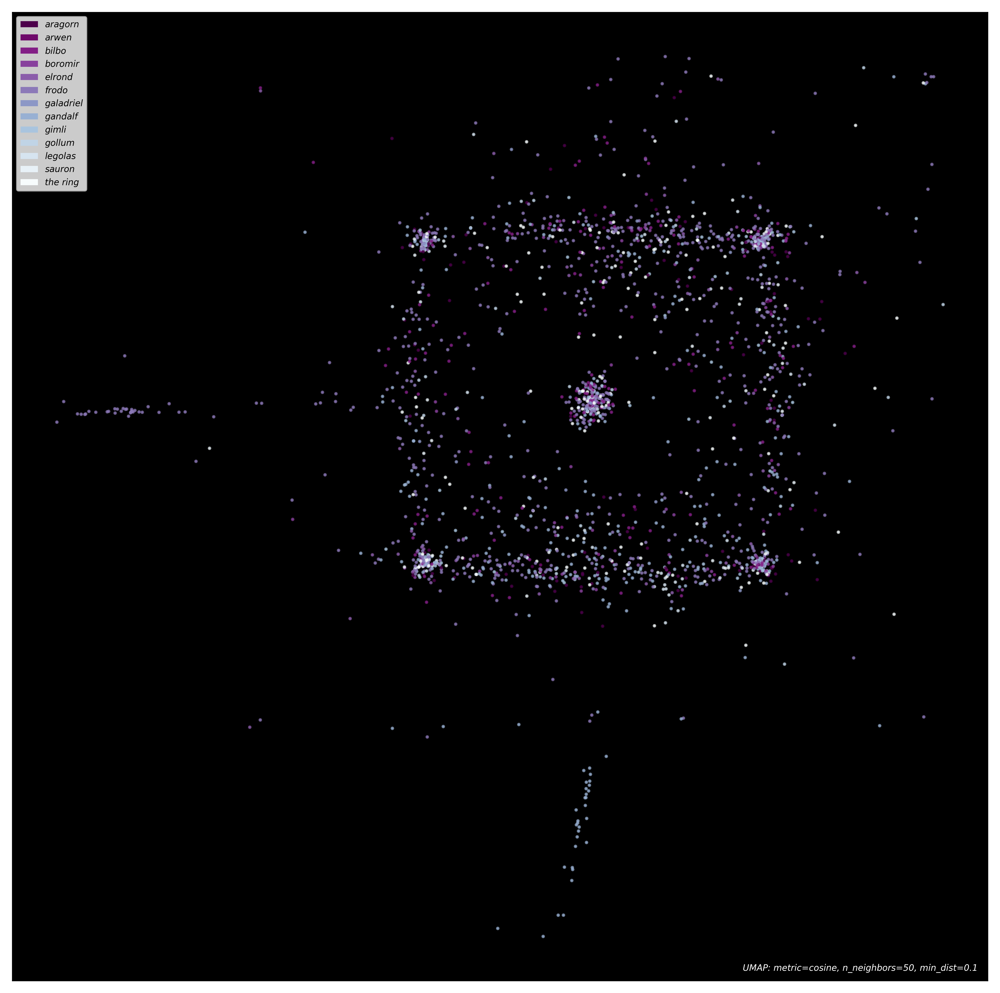

In [113]:
plt.rcParams['figure.dpi'] = 600
plt.rcParams["font.size"] = 5
plt.rcParams["font.style"] = "oblique"

fig, ax = plt.subplots(figsize=(10, 10))
umap.plot.points(mapper, labels=df['character'], color_key_cmap='BuPu_r', background='black', ax=ax, alpha=0.7)

for path in ax.collections:
    path.set_sizes([1]) 

plt.show()

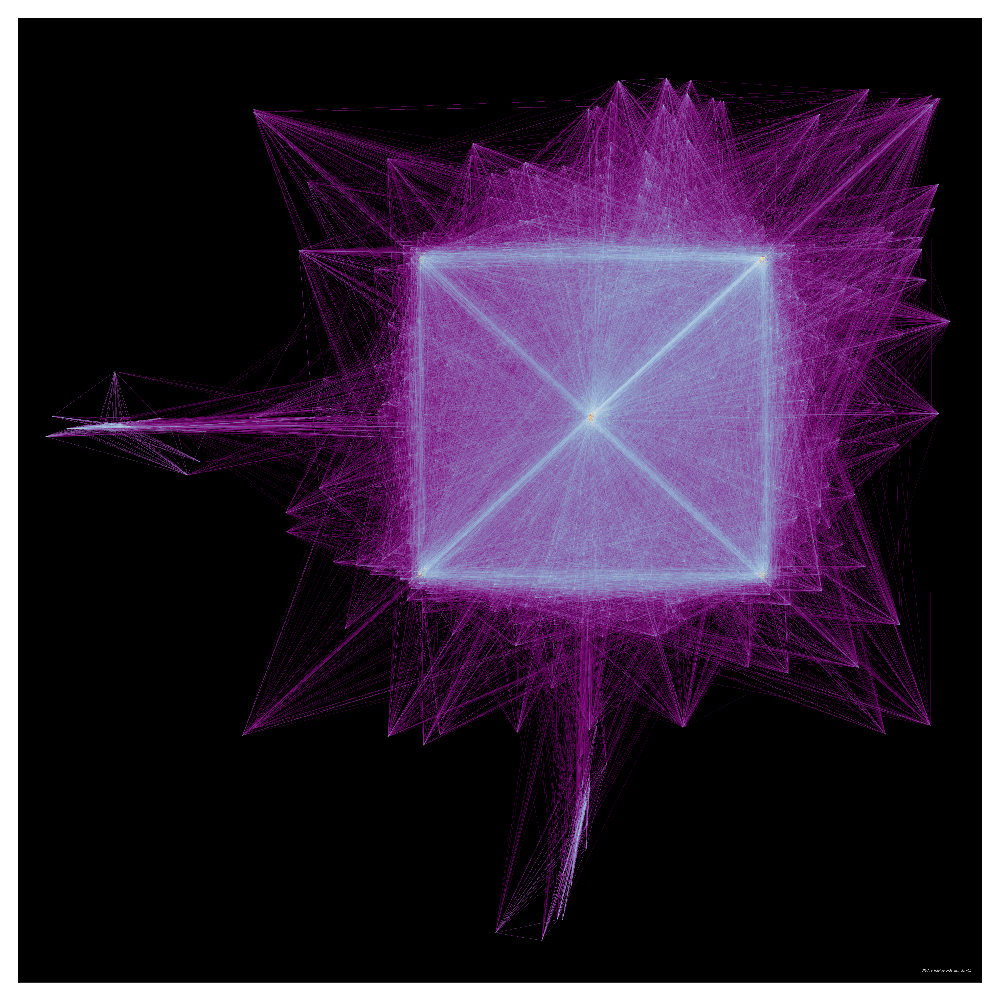

In [114]:
plt.rcParams['figure.dpi'] = 600
plt.rcParams["font.size"] = 1
umap.plot.connectivity(mapper, labels=df['character'], width=4000, height=4000, show_points=True, edge_cmap="BuPu_r", background="black")

plt.show()

/Users/yueqih/github-classroom/StoryLens/StoryLens/venv/lib/python3.13/site-packages/umap/plot.py:895: UserWarning: Hammer edge bundling is expensive for large graphs!
This may take a long time to compute!
  warn(


<Axes: >

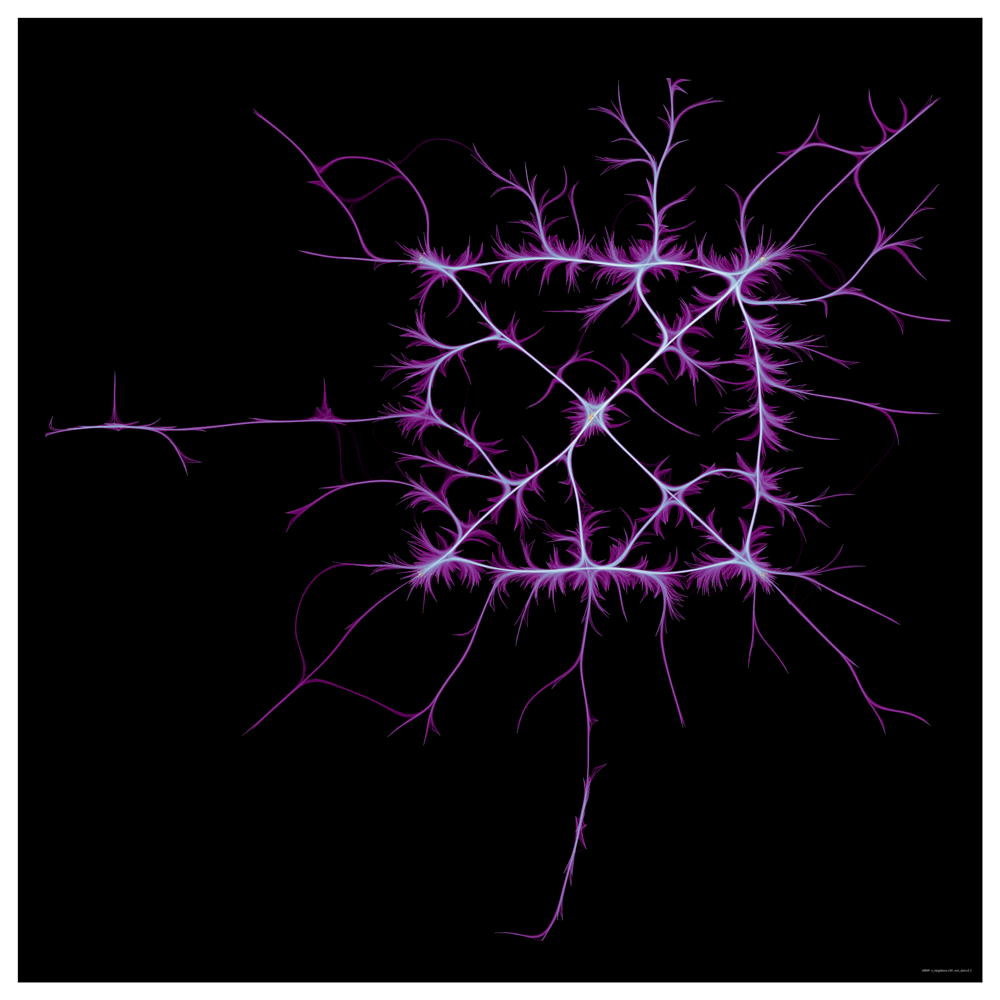

In [115]:
plt.rcParams['figure.dpi'] = 600
plt.rcParams["font.size"] = 1
umap.plot.connectivity(mapper, edge_bundling='hammer', labels=df['character'], width=4000, height=4000, edge_cmap="BuPu_r", show_points=True, background='black')